In [159]:
import sys
import pdb
import copy
import calendar
import importlib
import numpy as np
import xarray as xr
import cmasher as cmr
import matplotlib as mpl
from datetime import datetime
import matplotlib.pyplot as plt
from matplotlib import gridspec
import matplotlib.ticker as ticker
from cftime import DatetimeNoLeap as date
from matplotlib.colors import TwoSlopeNorm
from matplotlib.dates import DateFormatter
from matplotlib.ticker import FuncFormatter

plt.rcParams.update({
    'font.size'       : 14,   # Base font size
    'axes.labelsize'  : 13,   # Axis labels
    'xtick.labelsize' : 11,   # X-axis tick labels
    'ytick.labelsize' : 11,   # Y-axis tick labels
    'legend.fontsize' : 12,   # Legend font size
    'figure.titlesize': 16    # Figure title size
})
plt.ioff()

sys.path.insert(1, '/global/homes/j/jhollo/repos/climate_analysis/CLDERA/TEM/limvar_analysis_NERSC')
import plotting_utils as putil
import compute_ensemble_stats as ces
importlib.reload(putil)
importlib.reload(ces)
fix_dtint   = putil.adjust_10daily_integrated_tendency
shift_dtint = putil.shift_integrated_tendency
sig         = putil.filter_significance
cmn         = putil.get_cmap_norm

sys.path.insert(1, '/global/homes/j/jhollo/repos/climate_analysis/CLDERA/wavePaperFigs/util')
import nclcmaps as ncm

In [160]:
importlib.reload(putil)
importlib.reload(ces)

# ----- get counterfatual data
kwargs = {'freq':'monthly', 'return_intersection':False}
u           = putil.get_variable('U', **kwargs)['cfmean']
utendepfd   = putil.get_variable('utendepfd', **kwargs)['cfmean']
utendresvel = putil.get_variable('utendresvel', **kwargs)['cfmean']
utendgw     = putil.get_variable('utendgw', **kwargs)['cfmean']
utenddiff   = putil.get_variable('utenddiff', **kwargs)['cfmean']
epfy        = putil.get_variable('epfy', **kwargs)['cfmean']
epfz        = putil.get_variable('epfz', **kwargs)['cfmean']
psitem      = putil.get_variable('psitem', **kwargs)['cfmean']
psitem_gp   = putil.get_variable('psitem_gradlat', **kwargs)['cfmean']
psitem_glat = putil.get_variable('psitem_gradp', **kwargs)['cfmean']
trop        = putil.get_variable('TROP_P', **kwargs)['cfmean']

In [161]:
# ----- get climatology
allvars = [u, utendepfd, utendresvel, utendgw, utenddiff, epfy, epfz, psitem, psitem_gp, psitem_glat, trop]
climoyears = u.time.dt.year.values
climo = xr.merge(allvars)
climo = climo.groupby('time.month')
climo = climo.mean()
# ----- get 1991 monthly means
yoffset=7
data91 = xr.merge(allvars)
data91 = data91.sel(time=slice(date(1991+z,6,1), date(1992+z,5,1)))
data91 = data91.groupby('time.month').first()

In [164]:
importlib.reload(putil)
importlib.reload(ces)

def make_plot(month, var, levels, plottype='overlay', 
              rvvec=True, epvec=True, dslat=1, dsp=1, epvscale=1e13, logepvec=False, rvvscale=10, logrvvec=True):
    
    # --- process args
    monthstr = calendar.month_name[month]
    if(month > 5): yearstr=1991+yoffset
    else:          yearstr=1992+yoffset
    
    # --- plotting settings
    ulw, ulwz, ucolor = 0.75, 1.33, 'k'
    vw, vhw, vhl      = 0.008,2.4,4   # vector arrow width, head width, and head length to quiver()
    epvcolor            = 'k'          # EP flux vector arrow color
    rvvcolor            = 'royalblue'          # residual velocity vector arrow color
    vecolor           = 'w'          # vector outline color
    vlw               = 0.75         # vector outline linewidth
    pbuff            = 20           # tropopause buffer if remove_trop_vectors=True
    tlw, tcolor = 4, 'grey'  # tropopause linewidth, color
    cbheight = 0.77
    cmap = {'U':'RdYlBu_r', 'psitem':'RdYlBu_r', 'utendepfd':'BrBG_r', 'utendgw':'BrBG_r', 'utendresvel':'BrBG_r', 'utenddiff':'BrBG_r'}[var]
    scaling = {'U':1, 'psitem':1, 'utendepfd':2592000, 'utendresvel':2592000, 'utendgw':2592000, 'utenddiff':2592000}
    normtype = {'U':'twoslope', 'psitem':'uneven', 'utendepfd':'uneven', 'utendgw':'uneven', 'utendresvel':'uneven', 'utenddiff':'uneven'}[var]
    norm = putil.get_cmap_norm(levels, normtype)
    cfargs = {'levels':levels,'cmap':cmap, 'extend':'both', 'norm':norm}
    cargs  = {'levels':levels, 'colors':ucolor, 'linewidths':ulw}
    interp_vectors=True
    remove_trop_epvectors=False
    remove_trop_rvvectors=True
    
    # --- make axes
    fig = plt.figure()
    if(plottype == 'twopanel'):
        fig.set_size_inches(10,4.5)
        ax1 = fig.add_subplot(121)
        ax2 = fig.add_subplot(122)
        dvplt = ax2.contourf
        dvargs = cfargs
        cbpos = [0.945, (1-cbheight)/2-0.005, 0.02, cbheight]
        ax1.set_title('{} {}-{} climatology'.format(var, monthstr, climoyears[0], climoyears[-1]))
        ax2.set_title('{} 1991 mean'.format(var, monthstr))
        cblab = 'counterfactual $\\overline{{u}}$ [m/s]'
    elif(plottype == 'overlay'):
        fig.set_size_inches(5,4.5)
        ax1 = fig.add_subplot(111)
        ax2 = ax1
        dvplt = ax2.contour
        dvargs = cargs
        cbpos = [0.93, (1-cbheight)/2-0.005, 0.04, cbheight]
        cblab = '$\\overline{{u}}$ climatology [m/s]'
        ax1.set_title('{}'.format(monthstr), loc='left', pad=12, fontsize=18)
        
    # --- format
    for ax in [ax1, ax2]:
        ax.set_ylim([0.3, 1000])
        putil.format_paxis(ax)
        putil.format_lataxis(ax)
    ax1.set_ylabel('pressure [hPa]')
    putil.format_ticks(ax1)
    if(plottype == 'twopanel'):
        putil.format_ticks(ax2, y='right')
        plt.subplots_adjust(wspace=0.05)
    
    # --- plot variable
    cv  = climo[var].sel(month=month) * scaling[var]
    cvc = ax1.contourf(cv.lat, cv.plev, cv.T, **cfargs)
    dv =  data91[var].sel(month=month) * scaling[var]
    dvc = dvplt(dv.lat, dv.plev, dv.T, **dvargs)
    if(plottype=='overlay'):
        dvargs['levels']=0
        dvargs['linewidths']=ulwz
        dvplt(dv.lat, dv.plev, dv.T, **dvargs)
        
    # --- plot tropopause
    trop = climo['TROP_P'].sel(month=month)
    ax1.plot(trop.lat, trop/100, color=tcolor, lw=tlw)
        
    # --- overlay EP flux vector field
    epfy_, epfz_ = climo['epfy'].sel(month=month), climo['epfz'].sel(month=month)
    if(interp_vectors):
        # interpolate the vector field to a uniform grid in lat-log(p)
        epfy_, epfz_ = putil.regrid_vectors_latp(epfy_, epfz_)
    if(remove_trop_epvectors):
        # remove vectors in the troposphere so that they don't influence the length scaling
        epfy_ = putil.remove_troposphere(epfy_, trop, buffer=pbuff)
        epfz_ = putil.remove_troposphere(epfz_, trop, buffer=pbuff)
    # finally do EP flux vector scaling
    # This MUST be done last so that the vector scaling is not corrupted by later 
    # modifications to the figure or axes size or data limits
    Fx, Fy = putil.scale_EP_flux_vectors(fig, ax1, epfy_, epfz_, dslat=dslat, dsp=dsp,log_vectors=logepvec,
                                         dsplog=False, interp_lat=False, interp_plev=False)
    # plot scaled vector field
    alpha=1
    if(not epvec): alpha=0
    LAT, PLEV = np.meshgrid(Fx.lat, Fx.plev)
    qvep = ax1.quiver(LAT, PLEV, Fx.T, Fy.T, width=vw, headwidth=vhw, headlength=vhl, headaxislength=vhl*0.9, alpha=alpha,
                      scale=epvscale, scale_units='inches', color=epvcolor, zorder=20, edgecolor=vecolor, linewidth=vlw)
        
    # --- overlay residual velocity vector field
    glat_, gp_ = climo['psitem_gradlat'].sel(month=month), climo['psitem_gradp'].sel(month=month)
    if(interp_vectors):
        glat_, gp_, = putil.regrid_vectors_latp(glat_, gp_)
    if(remove_trop_rvvectors):
        # next remove vectors in the troposphere so that they don't influence the length scaling
        glat_ = putil.remove_troposphere(glat_, trop, buffer=pbuff)
        gp_   = putil.remove_troposphere(gp_, trop, buffer=pbuff)
    # finally get gradient-normal field from streamfunction
    gnx, gny = putil.streamfunction_gradient_normal(fig, ax1, dfdlat=glat_, dfdp=gp_, dslat=dslat, dsp=dsp, 
                                                    dsplog=False, interp_lat=False, interp_plev=False, 
                                                    log_vectors=logrvvec)
    # plot scaled vector field
    alpha=1
    if(not rvvec): alpha=0
    LAT, PLEV = np.meshgrid(gnx.lat, gnx.plev)
    qvrv = ax1.quiver(LAT, PLEV, gnx.T, gny.T, scale=rvvscale, width=vw, headwidth=vhw, headlength=vhl, headaxislength=vhl*0.9, 
                      color=rvvcolor, zorder=20, edgecolor=vecolor, linewidth=vlw, alpha=alpha)
    
    
    # --- colorbar
    cb = fig.colorbar(cvc, cax=fig.add_axes(cbpos), orientation='vertical', location='right', format=FuncFormatter(putil.cbarfmt), extendrect=True)
    cb.set_label(cblab)
    cb.set_ticks(cvc.levels)
    
    # --- legend
    if(plottype=='overlay'):
        dummy = ax1.plot([0,0],[0,0], color=ucolor, lw=ulw, label='{} $\\overline{{u}}$ every {} m/s'.format(yearstr, np.diff(levels)[0]))
        leg = ax1.legend(bbox_to_anchor=(0.508, 1.01), frameon=True, fancybox=False, edgecolor='k', handlelength=1)
        leg.get_frame().set_linewidth(0.66)
    
    plt.show()
    plt.savefig('figs/{}_climo_{}.png'.format(var, monthstr), dpi=200)

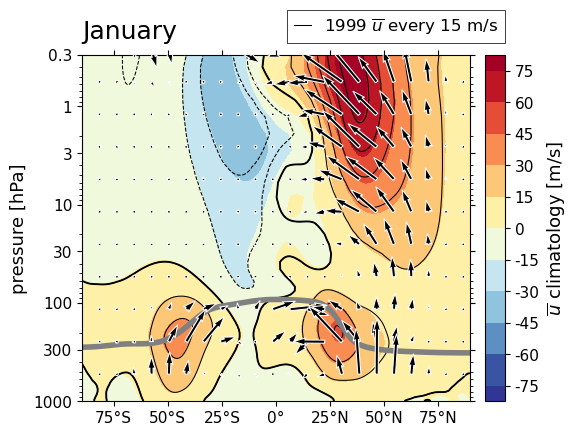

<Figure size 640x480 with 0 Axes>

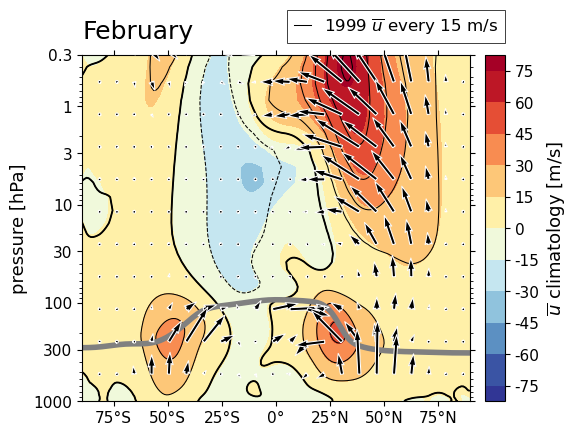

<Figure size 640x480 with 0 Axes>

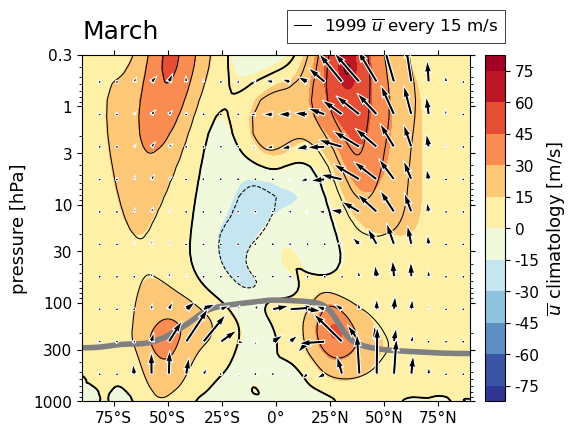

<Figure size 640x480 with 0 Axes>

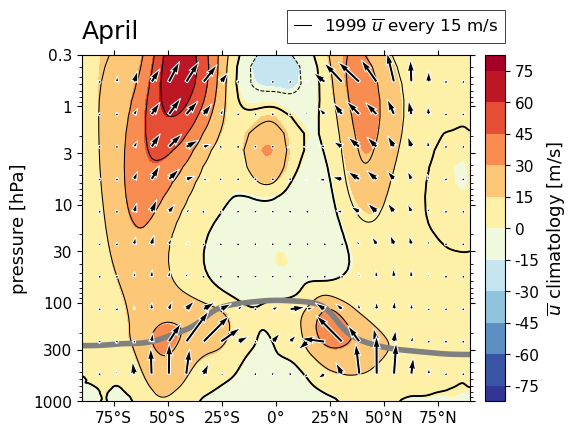

<Figure size 640x480 with 0 Axes>

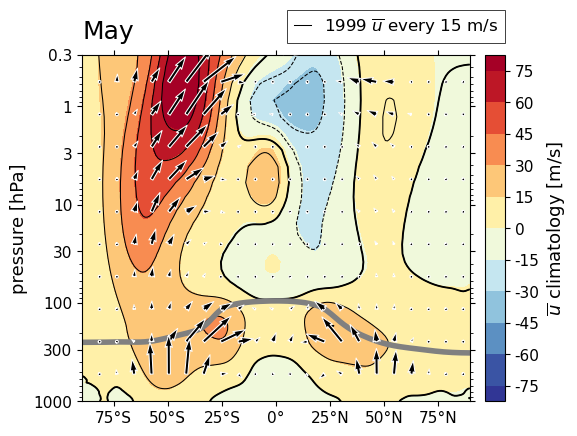

<Figure size 640x480 with 0 Axes>

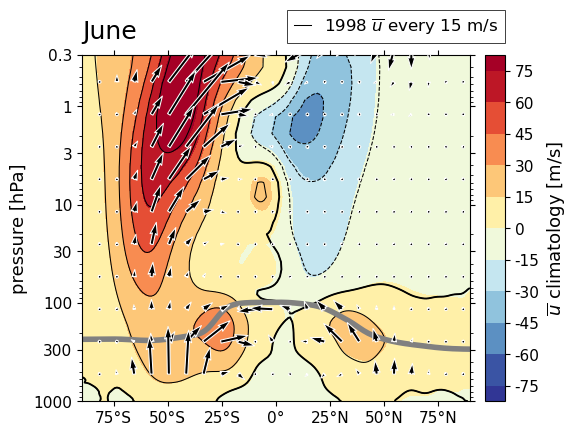

<Figure size 640x480 with 0 Axes>

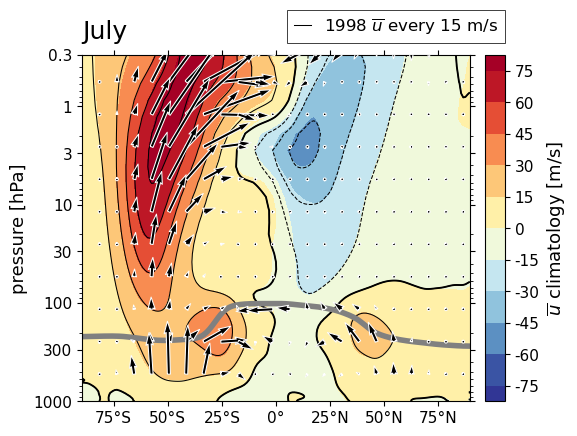

<Figure size 640x480 with 0 Axes>

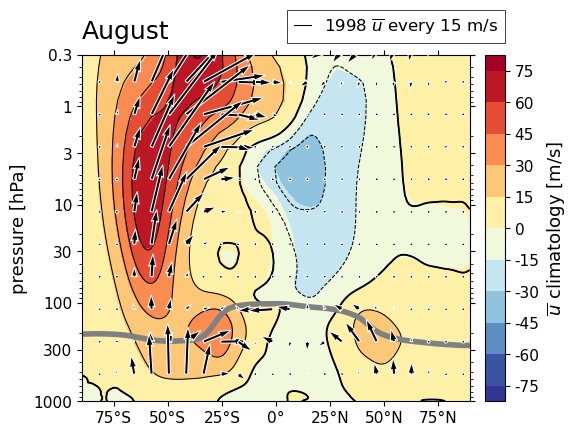

<Figure size 640x480 with 0 Axes>

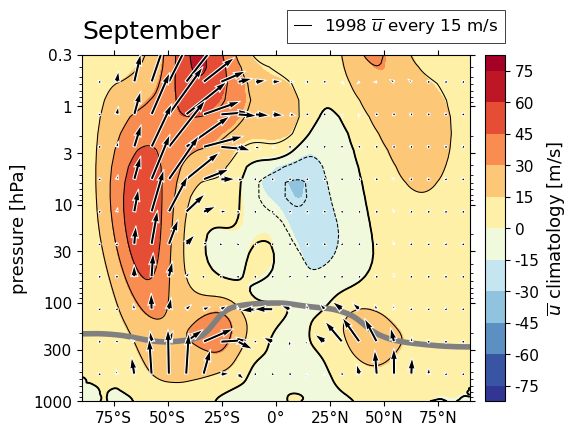

<Figure size 640x480 with 0 Axes>

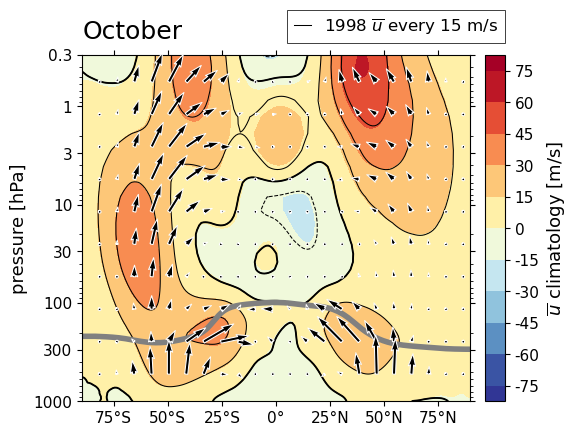

<Figure size 640x480 with 0 Axes>

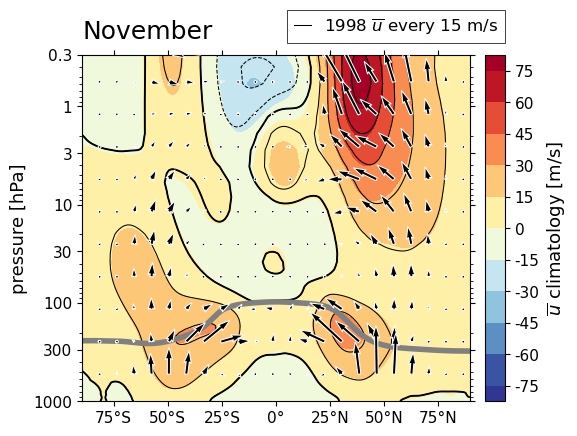

<Figure size 640x480 with 0 Axes>

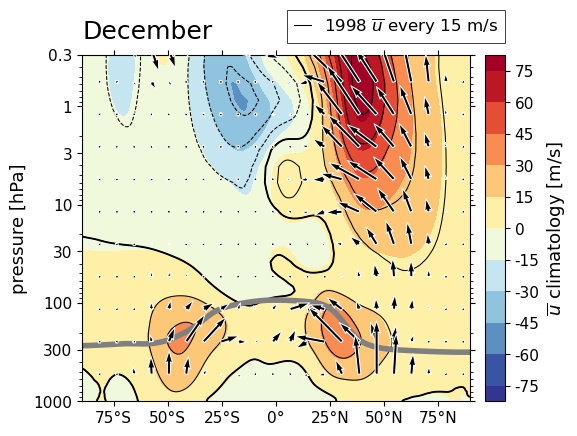

<Figure size 640x480 with 0 Axes>

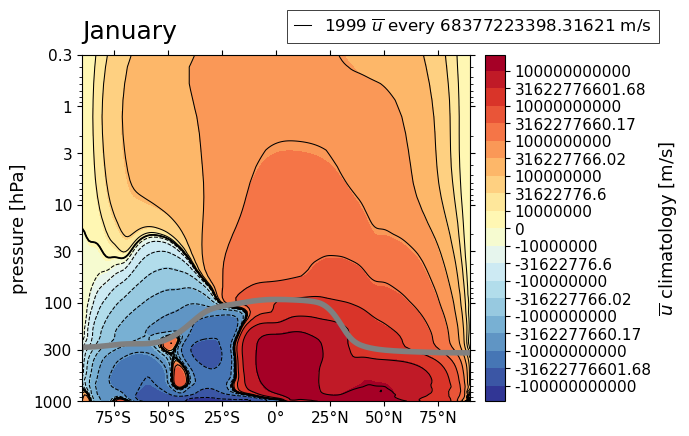

<Figure size 640x480 with 0 Axes>

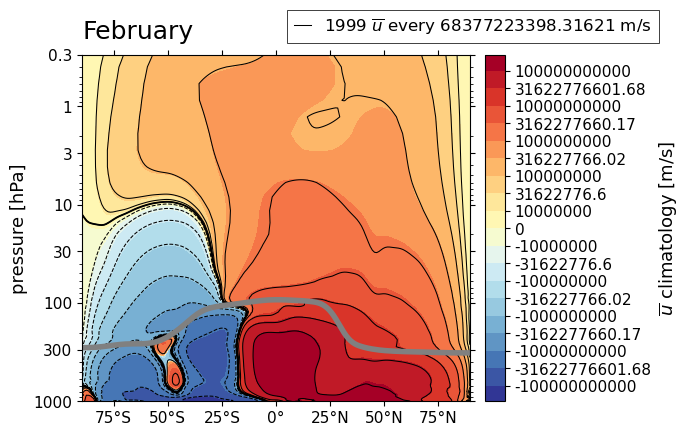

<Figure size 640x480 with 0 Axes>

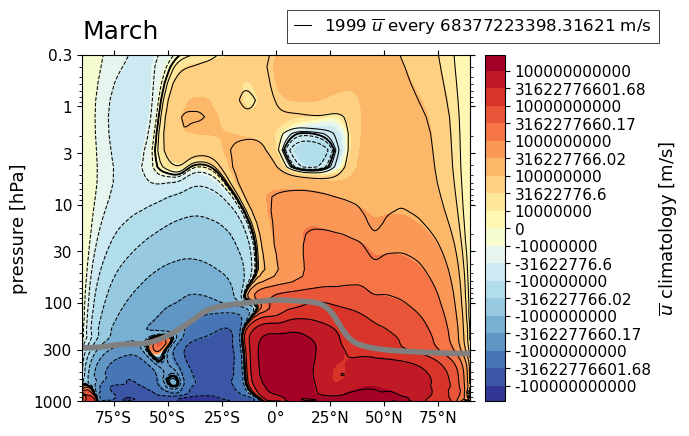

<Figure size 640x480 with 0 Axes>

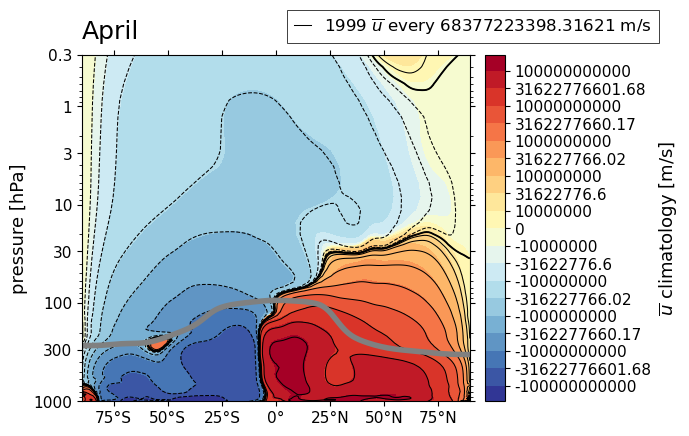

<Figure size 640x480 with 0 Axes>

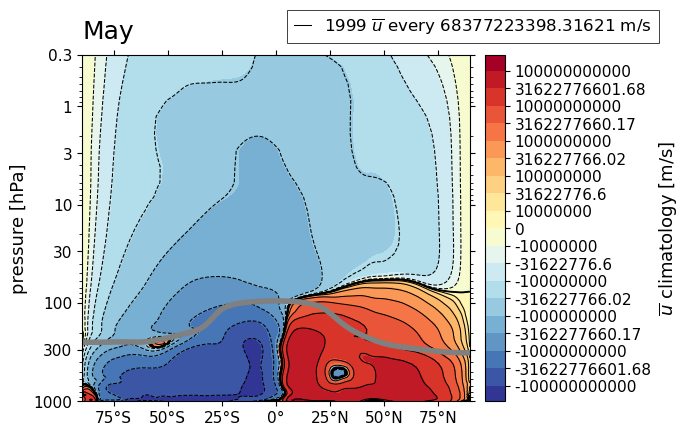

<Figure size 640x480 with 0 Axes>

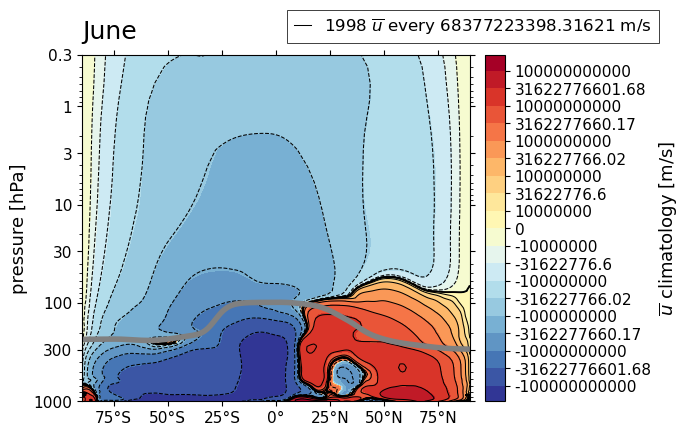

<Figure size 640x480 with 0 Axes>

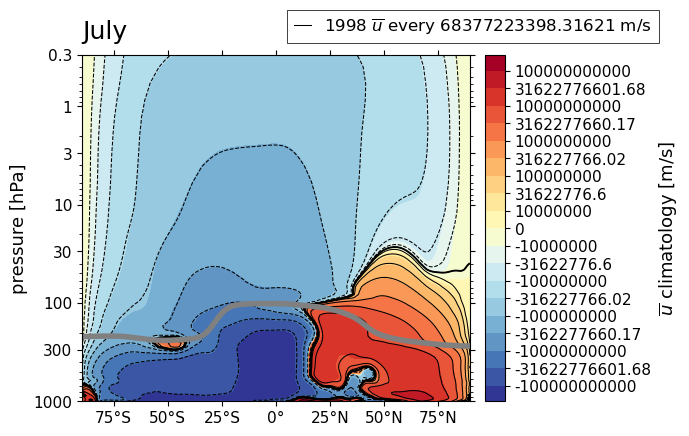

<Figure size 640x480 with 0 Axes>

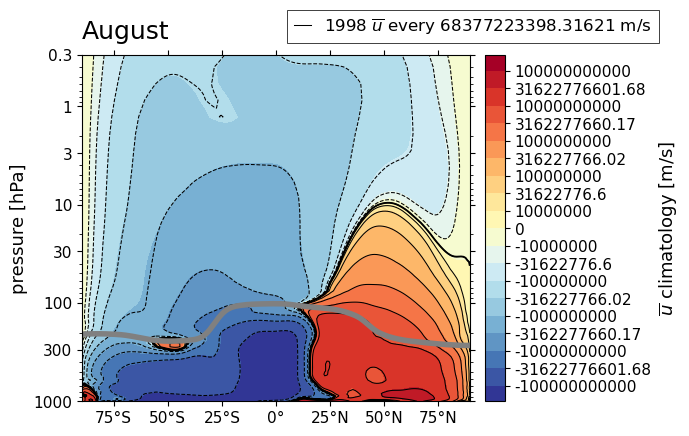

<Figure size 640x480 with 0 Axes>

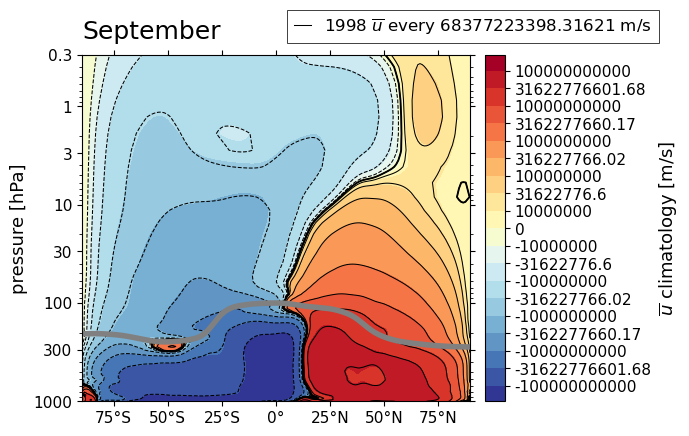

<Figure size 640x480 with 0 Axes>

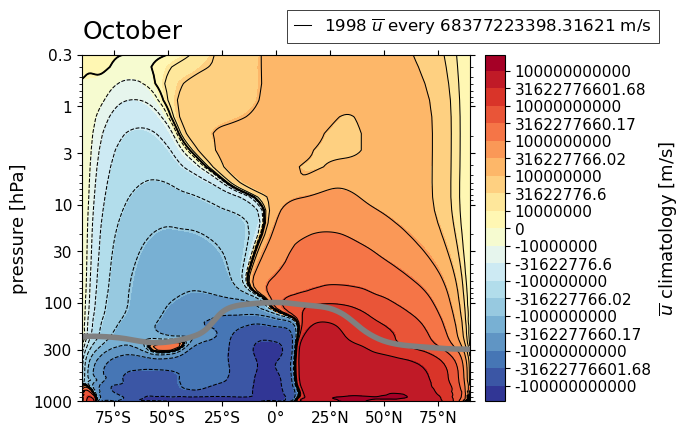

<Figure size 640x480 with 0 Axes>

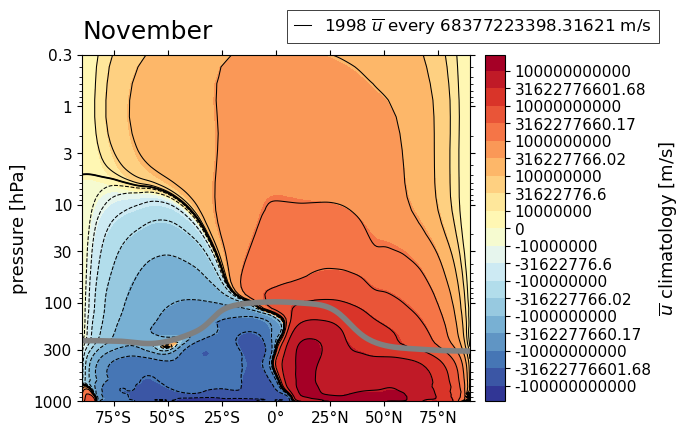

<Figure size 640x480 with 0 Axes>

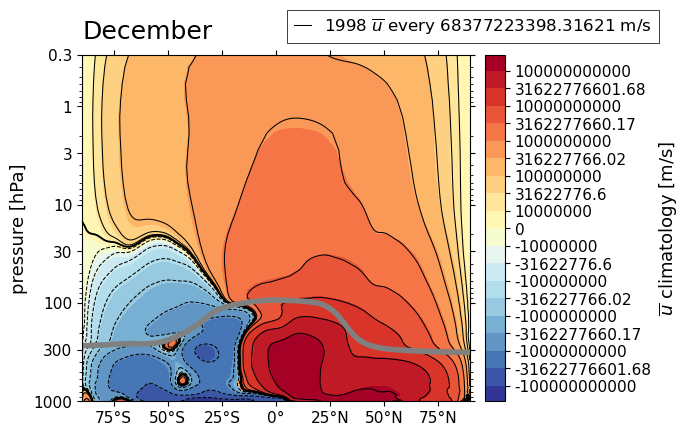

<Figure size 640x480 with 0 Axes>

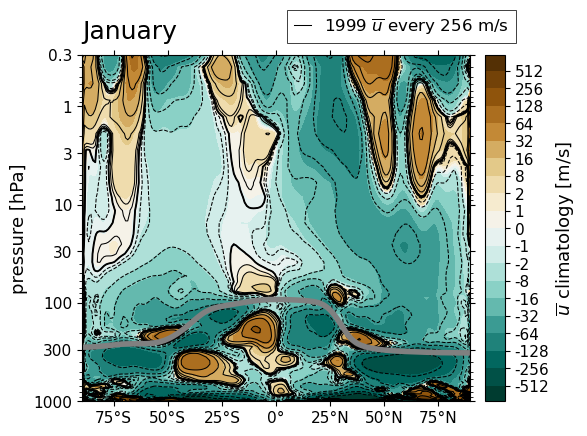

<Figure size 640x480 with 0 Axes>

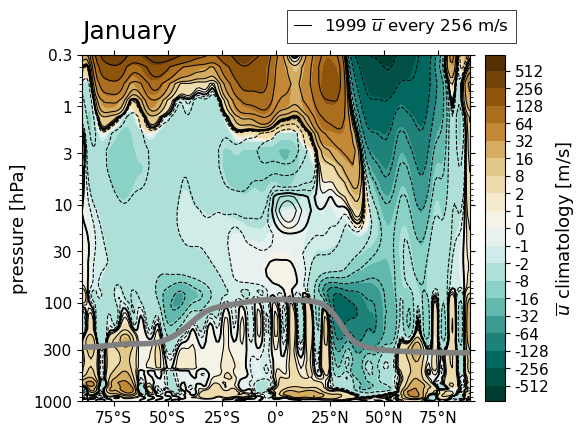

<Figure size 640x480 with 0 Axes>

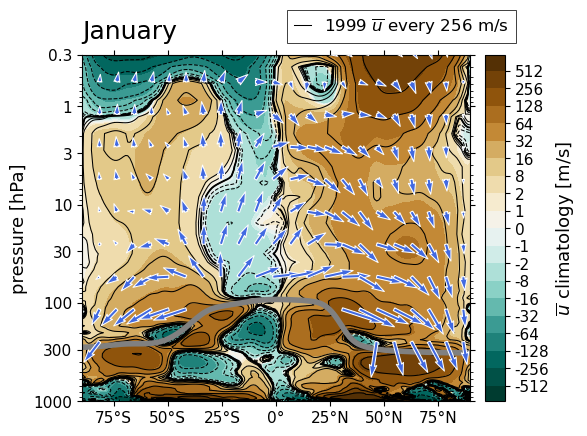

<Figure size 640x480 with 0 Axes>

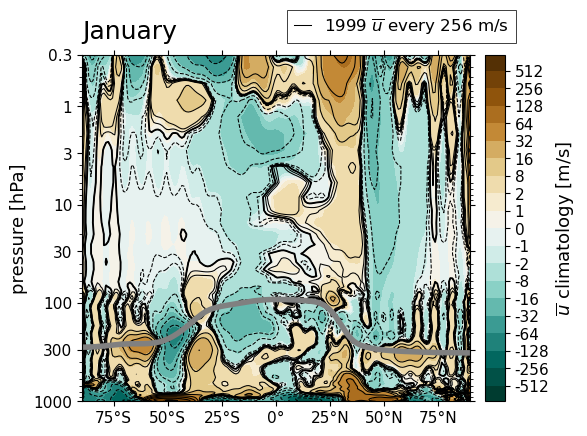

<Figure size 640x480 with 0 Axes>

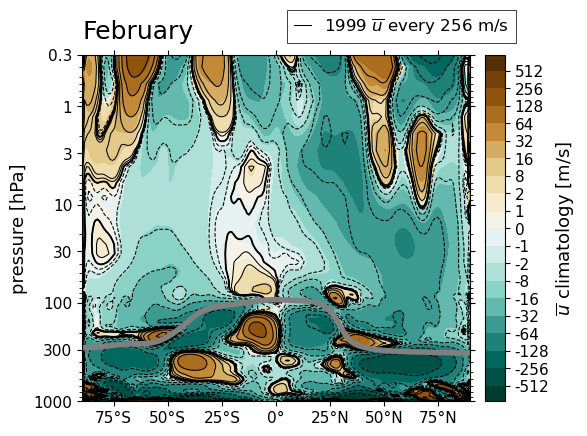

<Figure size 640x480 with 0 Axes>

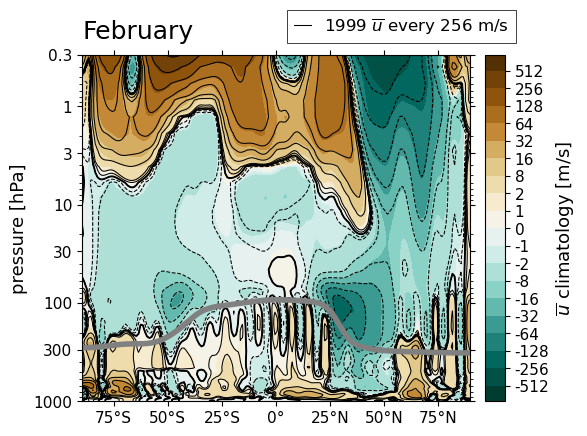

<Figure size 640x480 with 0 Axes>

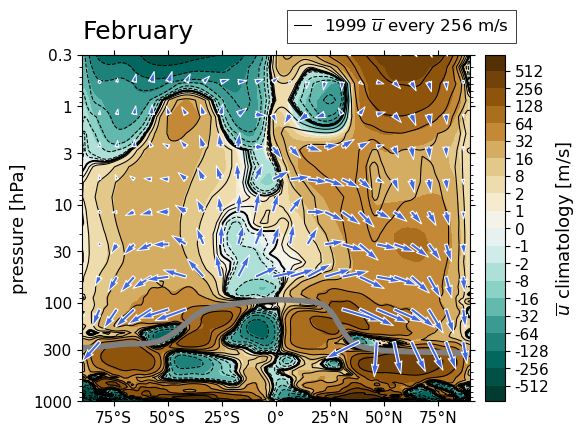

<Figure size 640x480 with 0 Axes>

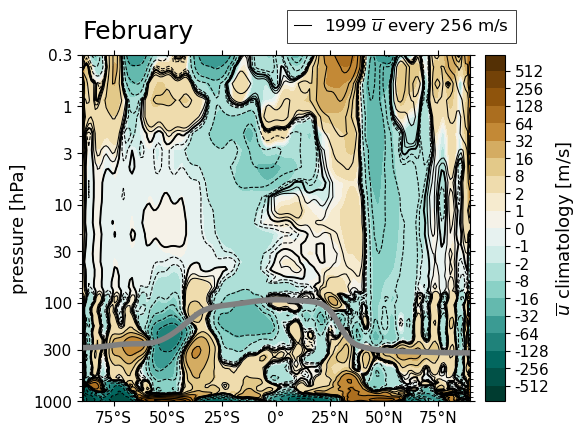

<Figure size 640x480 with 0 Axes>

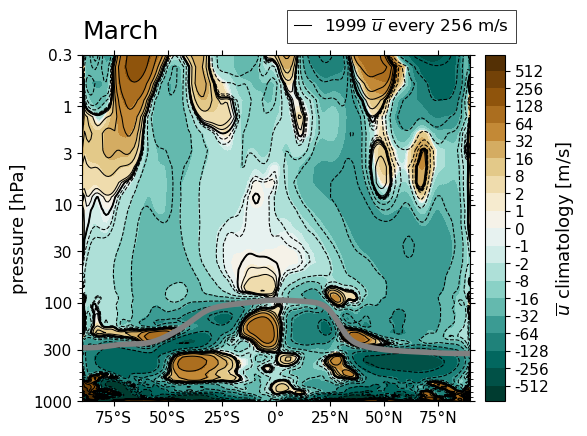

<Figure size 640x480 with 0 Axes>

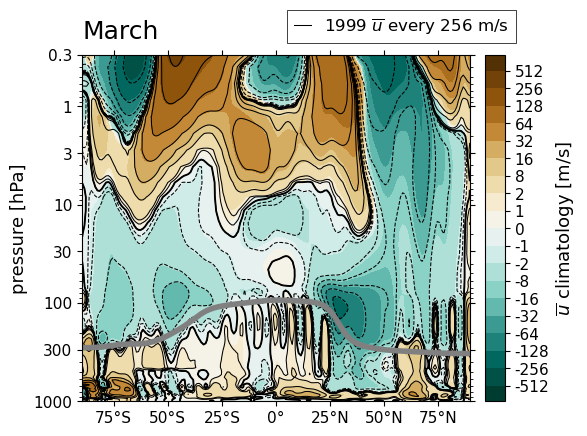

<Figure size 640x480 with 0 Axes>

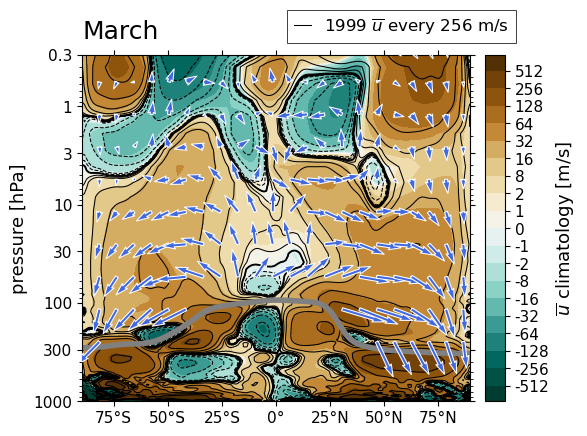

<Figure size 640x480 with 0 Axes>

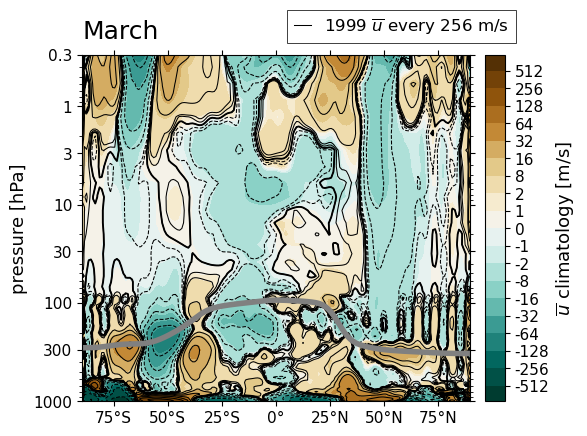

<Figure size 640x480 with 0 Axes>

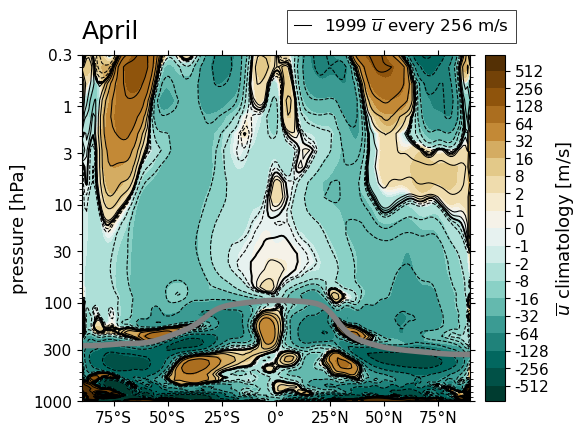

<Figure size 640x480 with 0 Axes>

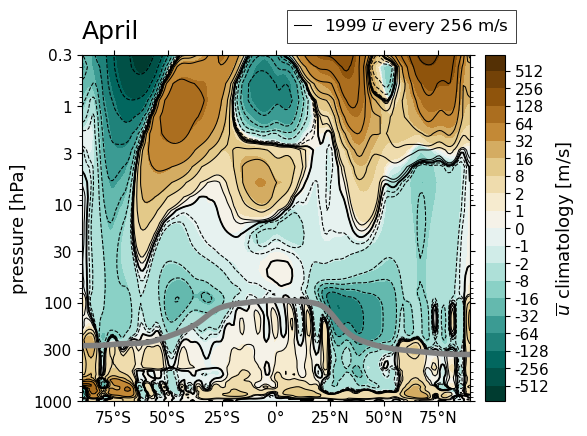

<Figure size 640x480 with 0 Axes>

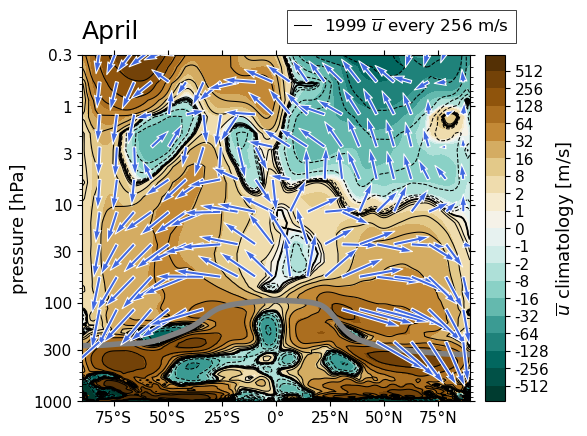

<Figure size 640x480 with 0 Axes>

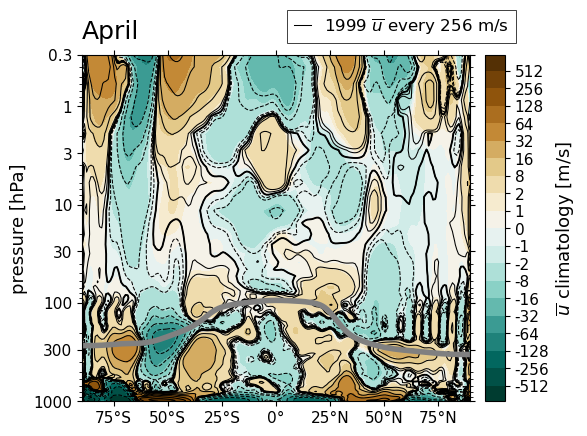

<Figure size 640x480 with 0 Axes>

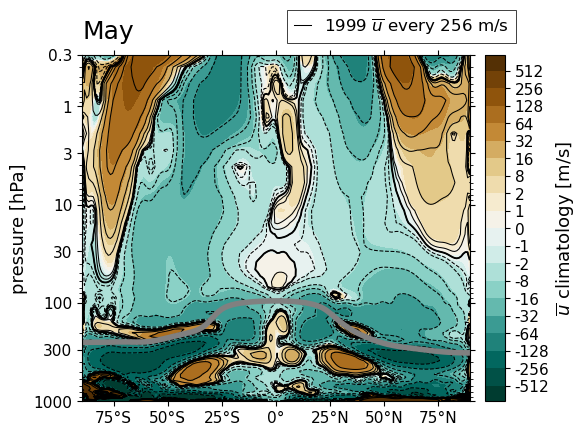

<Figure size 640x480 with 0 Axes>

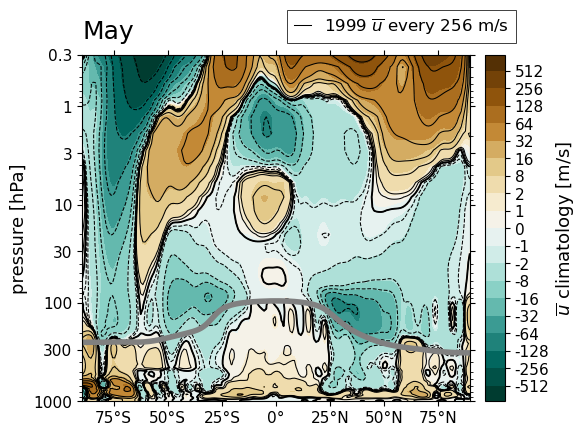

<Figure size 640x480 with 0 Axes>

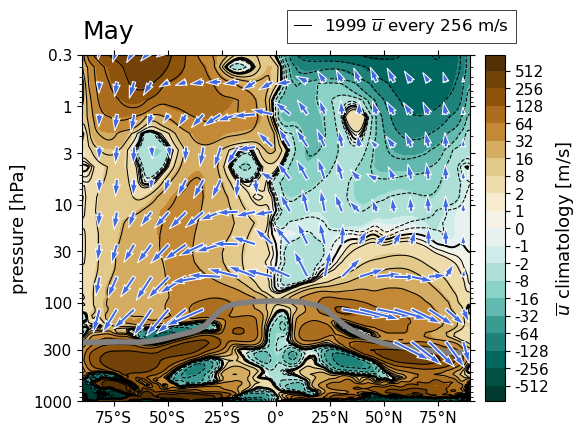

<Figure size 640x480 with 0 Axes>

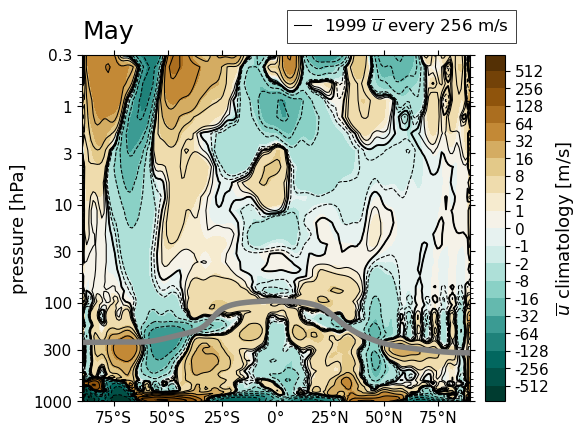

<Figure size 640x480 with 0 Axes>

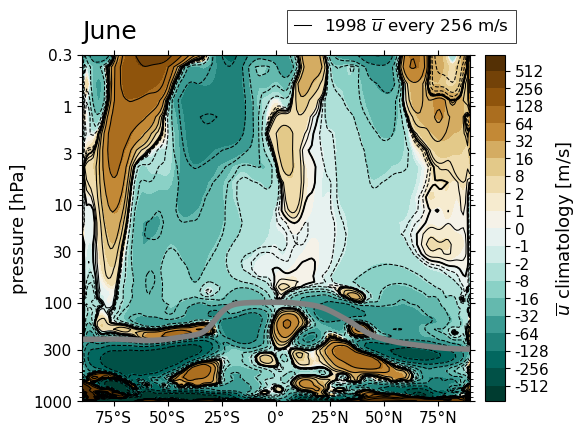

<Figure size 640x480 with 0 Axes>

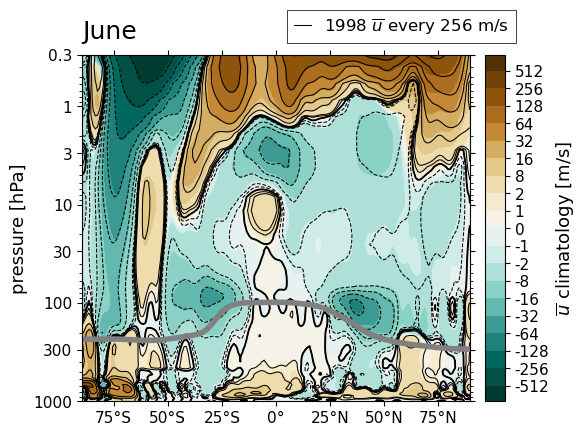

<Figure size 640x480 with 0 Axes>

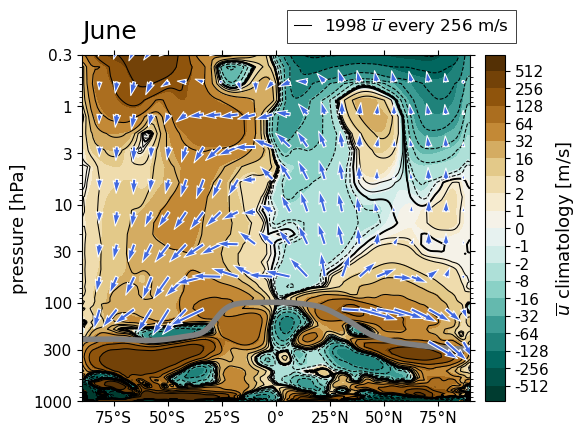

<Figure size 640x480 with 0 Axes>

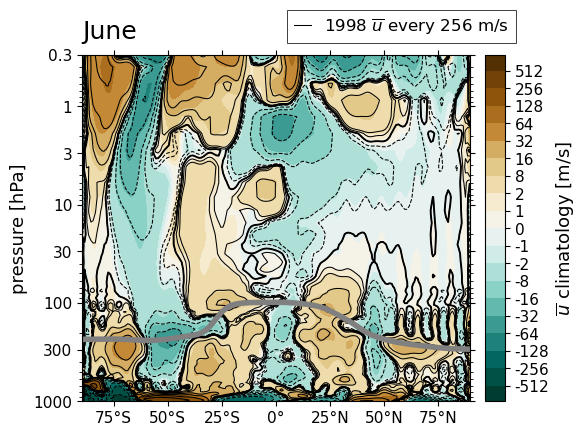

<Figure size 640x480 with 0 Axes>

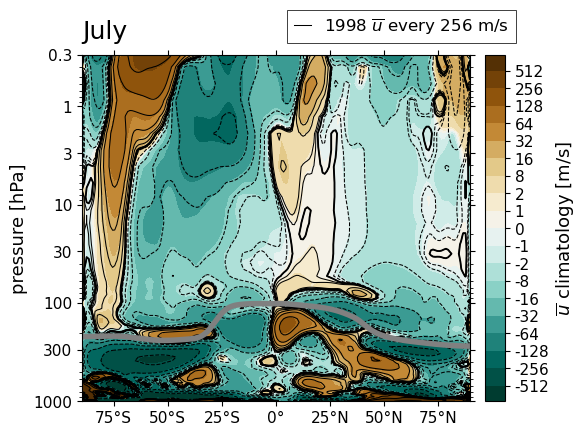

<Figure size 640x480 with 0 Axes>

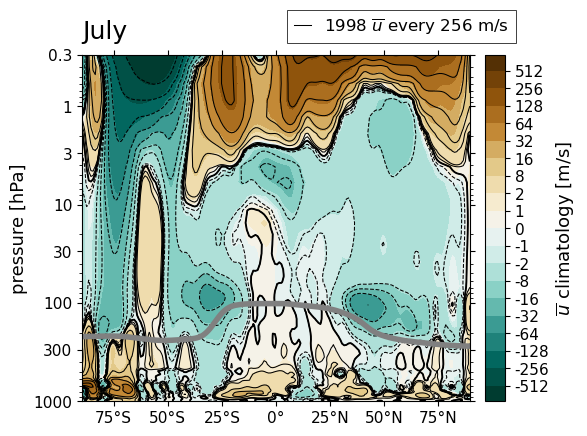

<Figure size 640x480 with 0 Axes>

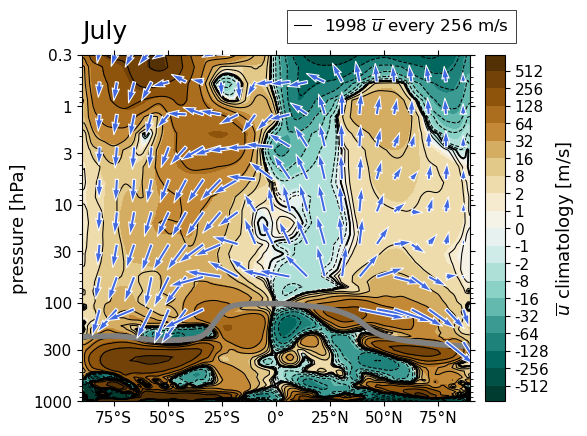

<Figure size 640x480 with 0 Axes>

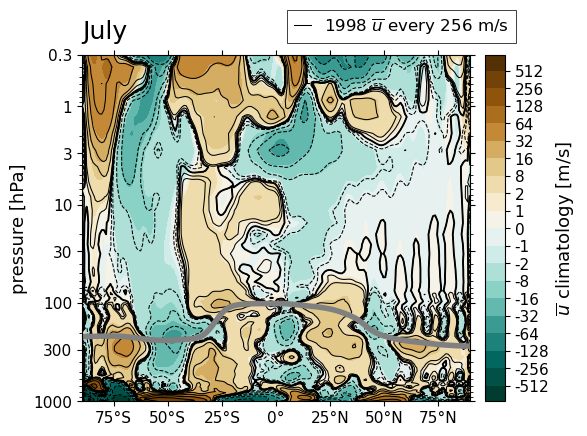

<Figure size 640x480 with 0 Axes>

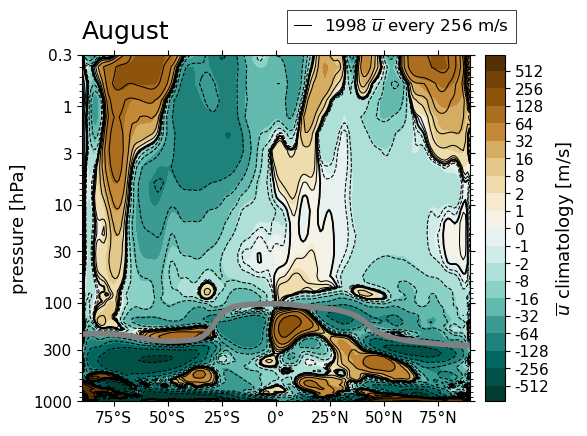

<Figure size 640x480 with 0 Axes>

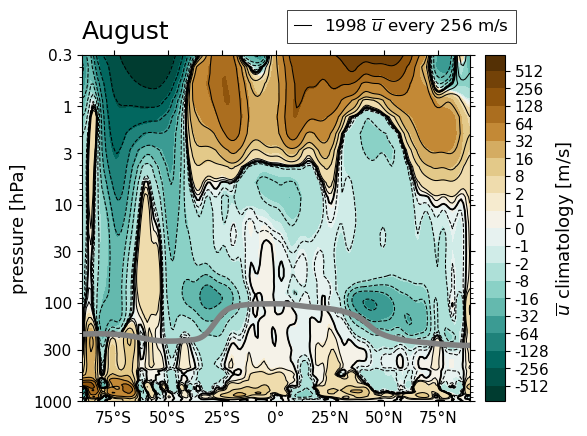

<Figure size 640x480 with 0 Axes>

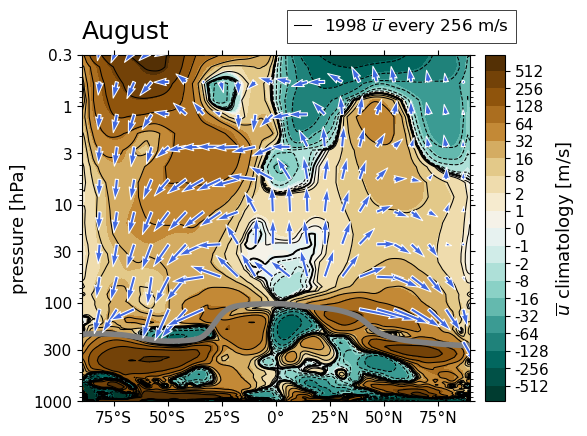

<Figure size 640x480 with 0 Axes>

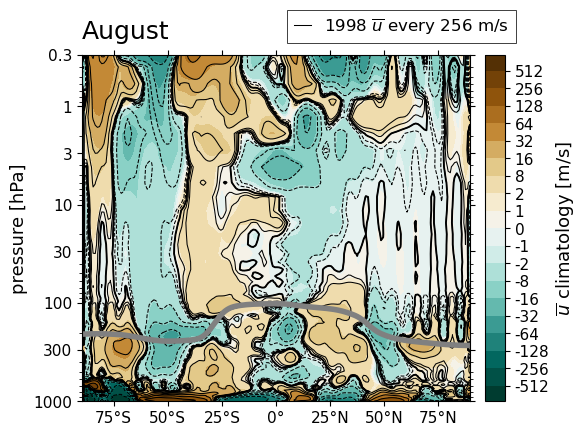

<Figure size 640x480 with 0 Axes>

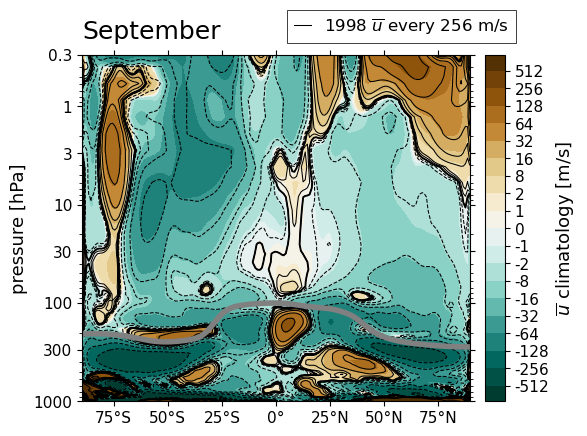

<Figure size 640x480 with 0 Axes>

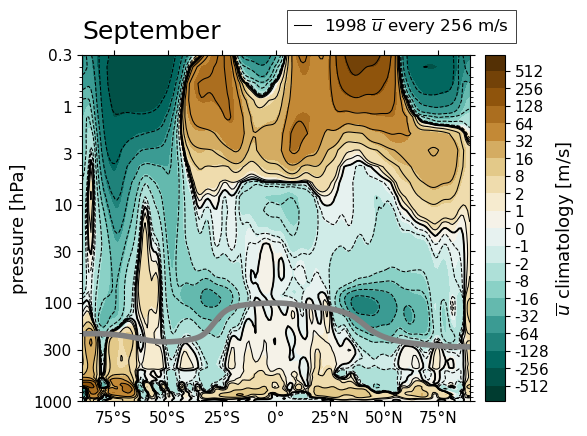

<Figure size 640x480 with 0 Axes>

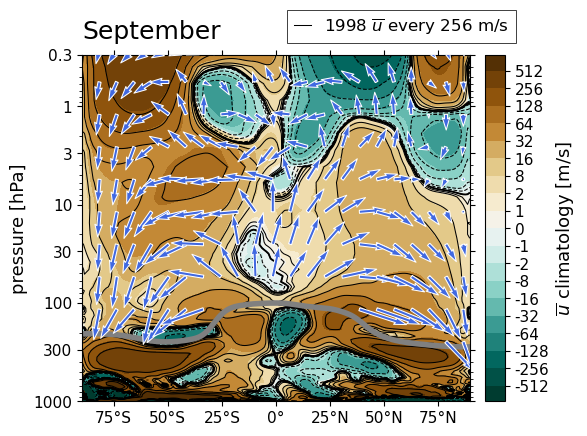

<Figure size 640x480 with 0 Axes>

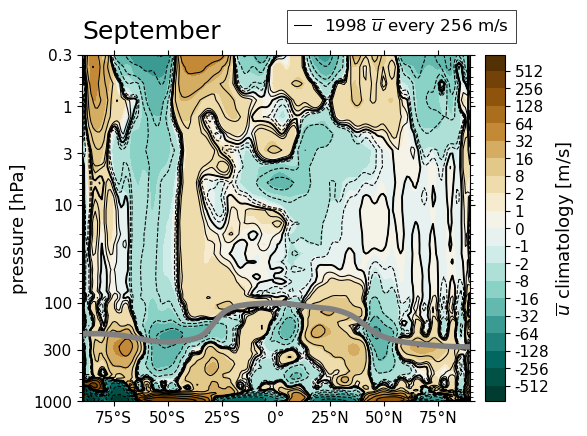

<Figure size 640x480 with 0 Axes>

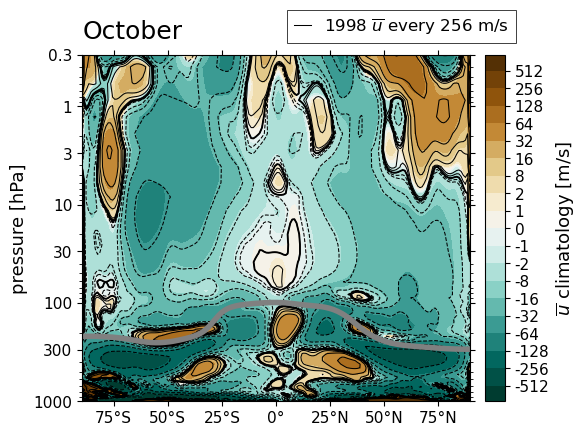

<Figure size 640x480 with 0 Axes>

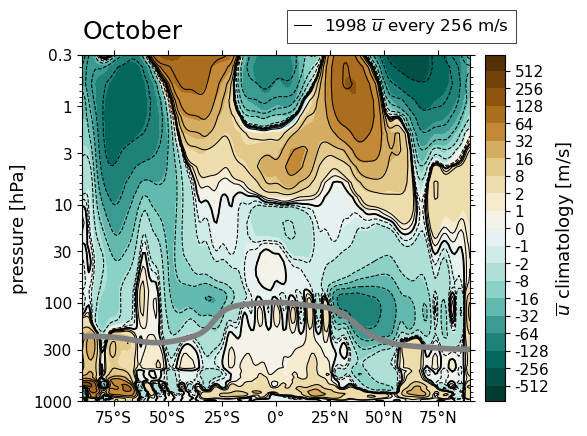

<Figure size 640x480 with 0 Axes>

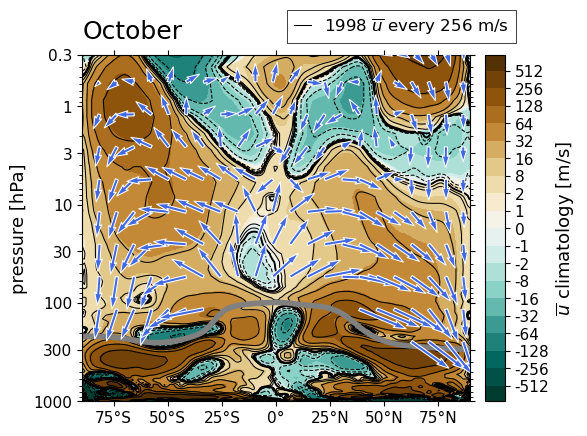

<Figure size 640x480 with 0 Axes>

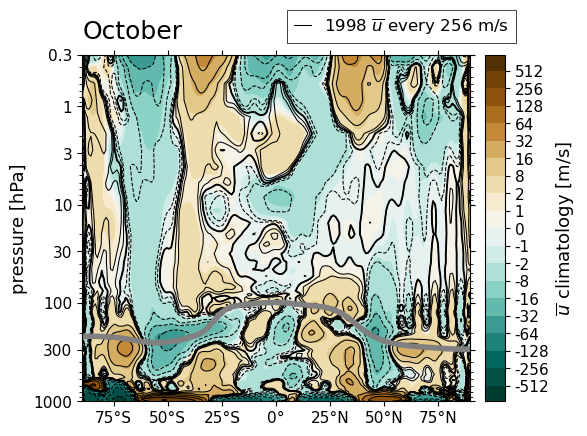

<Figure size 640x480 with 0 Axes>

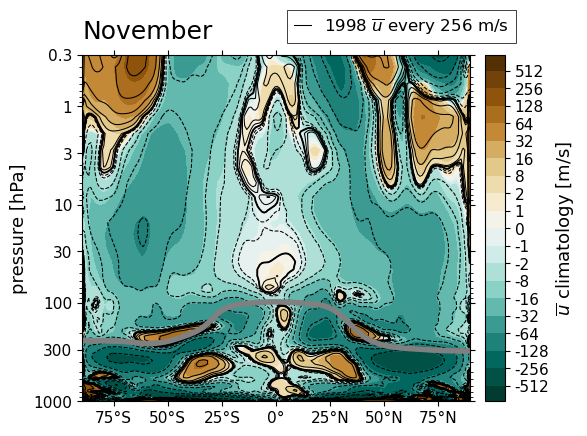

<Figure size 640x480 with 0 Axes>

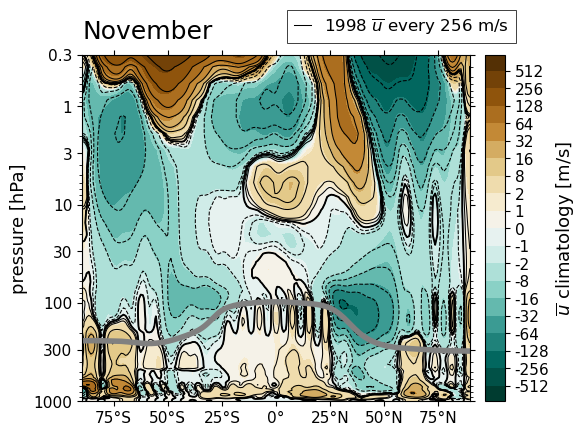

<Figure size 640x480 with 0 Axes>

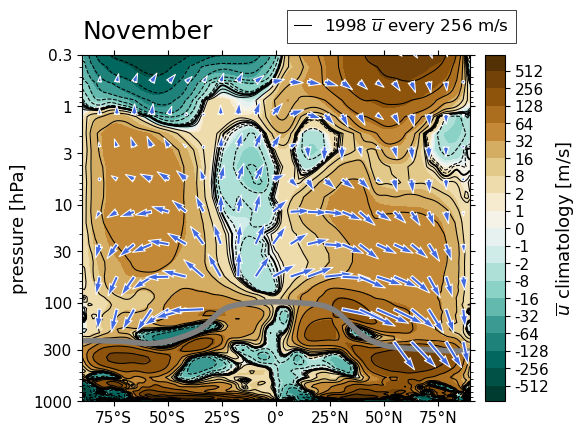

<Figure size 640x480 with 0 Axes>

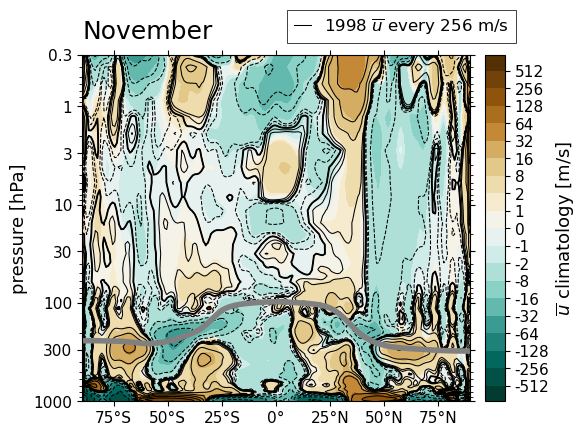

<Figure size 640x480 with 0 Axes>

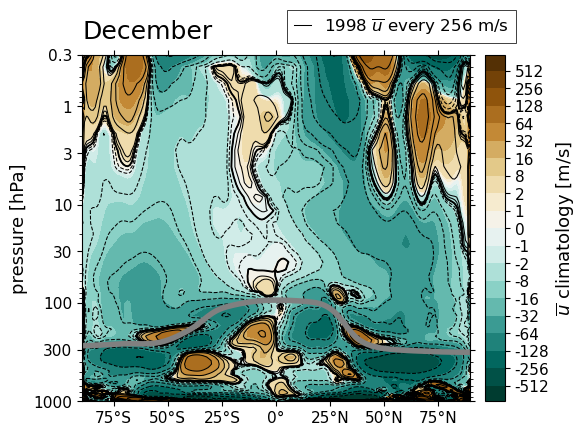

<Figure size 640x480 with 0 Axes>

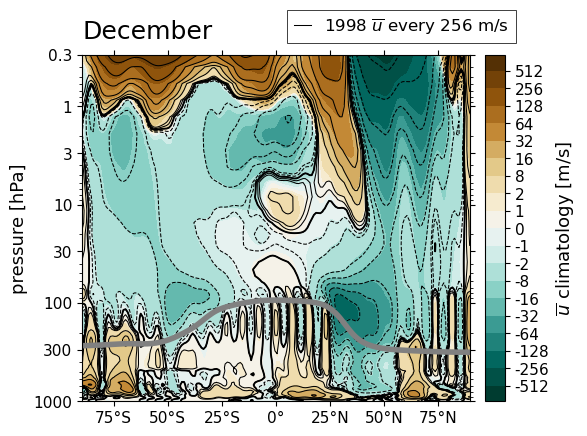

<Figure size 640x480 with 0 Axes>

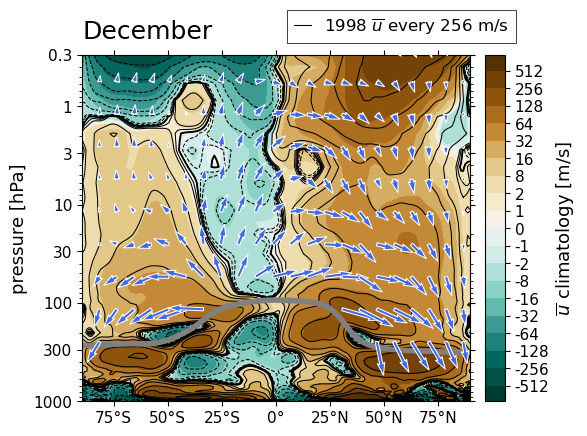

<Figure size 640x480 with 0 Axes>

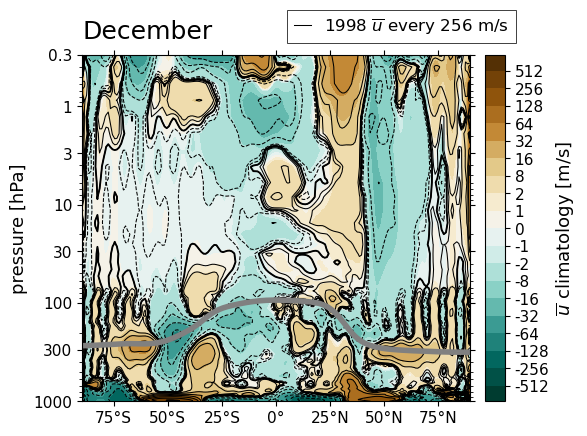

In [165]:
#plottype = 'twopanel'
plottype = 'overlay'
for i in range(12):
    make_plot(i+1, 'U', levels=np.arange(-75, 76, 15), plottype=plottype, epvscale=1.5e15, rvvscale=30, dslat=8, dsp=6, rvvec=False)
for i in range(12):
    make_plot(i+1, 'psitem', levels=putil.symlogspace(7, 11, 9), plottype=plottype, epvec=False, rvvec=False)
for i in range(12):
    levels = [1, 10, 30, 60, 90]
    levels = [1, 2, 8, 16, 32, 64, 128, 256, 512]
    levels = list(-np.array(levels)[::-1])+[0]+levels
    make_plot(i+1, 'utendepfd', levels=levels, plottype=plottype, epvec=False, rvvec=False)
    make_plot(i+1, 'utendgw', levels=levels, plottype=plottype, epvec=False, rvvec=False)
    make_plot(i+1, 'utendresvel', levels=levels, plottype=plottype, epvec=False, rvvec=True, rvvscale=30, dslat=8, dsp=6)
    make_plot(i+1, 'utenddiff', levels=levels, plottype=plottype, epvec=False, rvvec=False)